# EDA + Visualizations 🎨
Quick Exploratory Data Analysis for [Shopee Code League - Address Elements Extraction](https://www.kaggle.com/c/scl-2021-ds).

![](https://mir-s3-cdn-cf.behance.net/project_modules/max_1200/38648740180181.5774ef3930adc.jpg)

<a id="top"></a>

<div class="list-group" id="list-tab" role="tablist">
<h3 class="list-group-item list-group-item-action active" data-toggle="list" style='color:white; background:#FFA500; border:0' role="tab" aria-controls="home"><center>Quick Navigation</center></h3>

* [IMPORTANT: Indonesian Addresses](#0)
* [1. Data Preparation](#1)
* [2. Basic Data Exploration](#2)
* [3. Semantic Analysis](#3)
* [4. Text Length Analysis](#4)
* [5. Top Unigram Distribution](#5)
* [6. Top Brigram Distribution](#6)
* [7. Top Triagram Distribution](#7)
* [8. Most Common Words](#8)
* [9. Word Cloud](#9)
* [References](#10)

<a id="0"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>IMPORTANT: Indonesian Addresses<center><h2>

## Components
In order to get useful insights from the visualization below, I recommend you to understand the components in an Indonesian address.
   
From the highest to the lowest:
* **Provinsi** — Province
* **Kota** or **Kabupaten** — Regency
* **Kecamatan** — District
* **Kelurahan** or **Desa** — Village
* **RW**, an abbrev. of Rukun Warga (Neighborhood Unit)
* **RT**, an abbrev. of Rukun Tetangga (Community Unit)

The last two are subdivisions of a Village, and normally use numbers.

## Example 1 
Jl.janaka Rt 1 Rw 1 krajan Wringinanom Sambit Kabupaten Ponorogo Jawa Timur
* Jl Janaka — street name
* RT 1, RW 1 — as explained above
* Krajan — Village
* Wringinanom — District
* Kabupaten Ponorogo — Regency
* Jawa Timur — Province

## Example 2
Jalan Candi Panggung Barat. No 16 . RT 01 RW 18. Kelurahan Mojolangu, Kecamatan Lowokwaru Malang City , East Java
* Jalan Candi Panggung Barat. No 16 — street name and number
* RT 01, RW 18 — as explained above
* Kelurahan Mojolangu — Village
* Kecamatan Lowokwaru — District
* Malang City — Regency
* East Java (Jawa Timur) — Province

## Common abbreviation
* gg/gg./gang referes to an alley.
* jl/jln/jalan/jl./jln. refers to Jalan (Street)
* no./nomor/no refers to number
* kec./kecamatan/kec refers to Kecamatan
* kel./kelurahan/kel refers to Kelurahan
* kab./kabupaten/kab refers to Kabupaten

<a id="1"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>1. Data Preparation<center><h2>

## Import Libraries

In [4]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

!pip install chart_studio
!pip install textstat
!pip install cufflinks
!pip install wordcloud
!pip install pandas_profiling

import numpy as np 
import pandas as pd

# Visualization 
import matplotlib.pyplot as plt
import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
import seaborn as sns
%matplotlib inline

# Word Cloud
from wordcloud import WordCloud

# sklearn 
from sklearn.feature_extraction.text import CountVectorizer

# Pandas Profiling
from pandas_profiling import ProfileReport

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

     |████████████████████████████████| 243 kB 2.5 MB/s eta 0:00:01
     |████████████████████████████████| 75 kB 3.1 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 1.5 MB/s eta 0:00:01


     |████████████████████████████████| 295 kB 2.7 MB/s eta 0:00:01


  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27084 sha256=0e60fccfa731090111189b9856e021b0756d15a2ff3fb20bf5a312f2f224f48b
  Stored in directory: /Users/aanabdurrahman/Library/Caches/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
  Created wheel for phik: filename=phik-0.11.2-py3-none-any.whl size=1107412 sha256=e0e7b41b9e763fb5d26dd8e8b2d9a868847d1c2810aba273cb89636d43275679
  Stored in directory: /Users/aanabdurrahman/Library/Caches/pip/wheels/72/9a/23/097c93fd8341220d92674891b6a9a30f0e389719d9b7291bd2
Successfully built htmlmin phik


## Dataset Preparation

In [5]:
df = pd.read_csv("dataset/train.csv")
validation = pd.read_csv("dataset/test.csv")

In [6]:
df.head()

,id,raw_address,POI/street
0,0,jl kapuk timur delta sili iii lippo cika 11 a ...,/jl kapuk timur delta sili iii lippo cika
1,1,"aye, jati sampurna",/
2,2,setu siung 119 rt 5 1 13880 cipayung,/siung
3,3,"toko dita, kertosono",toko dita/
4,4,jl. orde baru,/jl. orde baru


In [7]:
validation.head()

,id,raw_address
0,0,s. par 53 sidanegara 4 cilacap tengah
1,1,"angg per, baloi indah kel. lubuk baja"
2,2,"asma laun, mand imog,"
3,3,"ud agung rej, raya nga sri wedari karanganyar"
4,4,"cut mutia, 35 baiturrahman"


<a id="2"></a>
[Table of Contents](#top)
<h2 style='background:#FFA500; border:0; color:white'><center>2. Basic Data Exploration<center><h2>

## Extract POI and Street

In [5]:
df[['POI', 'street']] = df['POI/street'].str.split('/', 1, expand=True)
df['POI/street'].replace('/', np.nan, inplace=True)
df['POI'].replace('', np.nan, inplace=True)
df['street'].replace('', np.nan, inplace=True)
df.head()

,id,raw_address,POI/street,POI,street
0,0,jl kapuk timur delta sili iii lippo cika 11 a ...,/jl kapuk timur delta sili iii lippo cika,NaN,jl kapuk timur delta sili iii lippo cika
1,1,"aye, jati sampurna",NaN,NaN,NaN
2,2,setu siung 119 rt 5 1 13880 cipayung,/siung,NaN,siung
3,3,"toko dita, kertosono",toko dita/,toko dita,NaN
4,4,jl. orde baru,/jl. orde baru,NaN,jl. orde baru


## Missing Values
We will replace all '/' or empty string with NaN and then we will count all of the missing values in the training set. At the end, if you want, you can remove all the rows with missing values in both POI and street columns.

In [6]:
def missing_value_of_data(data):
    total = data.isnull().sum().sort_values(ascending=False)
    percentage = round(total/data.shape[0]*100,2)
    return pd.concat([total,percentage], axis=1, keys=['Total','Percentage'])

In [7]:
missing_value_of_data(df)

,Total,Percentage
POI,178509,59.50
street,70143,23.38
POI/street,31993,10.66
id,0,0.00
raw_address,0,0.00


## Duplicate Values

In [8]:
def duplicated_values_data(data):
    dup=[]
    columns=data.columns
    for i in data.columns:
        dup.append(sum(data[i].duplicated()))
    return pd.concat([pd.Series(columns),pd.Series(dup)],axis=1,keys=['Columns','Duplicate count'])

In [9]:
df_cleaned = df.dropna()
duplicated_values_data(df_cleaned)

,Columns,Duplicate count
0,id,0
1,raw_address,0
2,POI/street,4065
3,POI,12422
4,street,50254


## Glimpse of Data

In [10]:
ProfileReport(df, title='Pandas Profiling Report', explorative=True)

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

[Table of Contents](#top)
<a id="3"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>3. Semantic Analysis<center><h2>

We will take a look at the different punctuation in addresses.

In [11]:
qmarks = np.mean(df['raw_address'].apply(lambda x: '?' in x))
math = np.mean(df['raw_address'].apply(lambda x: '[math]' in x))
fullstop = np.mean(df['raw_address'].apply(lambda x: '.' in x))
capital_first = np.mean(df['raw_address'].apply(lambda x: x[0].isupper()))
capitals = np.mean(df['raw_address'].apply(lambda x: max([y.isupper() for y in x])))
numbers = np.mean(df['raw_address'].apply(lambda x: max([y.isdigit() for y in x])))

print('Address with question marks: {:.2f}%'.format(qmarks * 100))
print('Address with [math] tags: {:.2f}%'.format(math * 100))
print('Address with full stops: {:.2f}%'.format(fullstop * 100))
print('Address with capital letters: {:.2f}%'.format(capitals * 100))
print('Address with numbers: {:.2f}%'.format(numbers * 100))

Address with question marks: 0.01%
Address with [math] tags: 0.00%
Address with full stops: 19.77%
Address with capital letters: 0.00%
Address with numbers: 59.32%


[Table of Contents](#top)
<a id="4"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>4. Text Length Analysis<center><h2>

We calculate the number of words in each address and look at the length distribution.

In [12]:
lens = df.raw_address.str.split().apply(lambda x: len(x))
print(lens.describe())

count    300000.000000
mean          6.842183
std           2.827218
min           1.000000
25%           5.000000
50%           6.000000
75%           9.000000
max          32.000000
Name: raw_address, dtype: float64


Results of this calculation establish that text length is short (average length of 7 words).

In [13]:
df['text_len'] = df['raw_address'].astype(str).apply(len)
df['text_word_count'] = df['raw_address'].apply(lambda x: len(str(x).split()))
df.head()

,id,raw_address,POI/street,POI,street,text_len,text_word_count
0,0,jl kapuk timur delta sili iii lippo cika 11 a ...,/jl kapuk timur delta sili iii lippo cika,NaN,jl kapuk timur delta sili iii lippo cika,66,13
1,1,"aye, jati sampurna",NaN,NaN,NaN,18,3
2,2,setu siung 119 rt 5 1 13880 cipayung,/siung,NaN,siung,36,8
3,3,"toko dita, kertosono",toko dita/,toko dita,NaN,20,3
4,4,jl. orde baru,/jl. orde baru,NaN,jl. orde baru,13,3


## Text Length Distribution

In [14]:
df['text_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='text length',
    linecolor='black',
    color='red',
    yTitle='count',
    title='Text Length Distribution')

## Text Word Count

In [15]:
df['text_word_count'].iplot(
    kind='hist',
    bins=50,
    xTitle='text length',
    linecolor='black',
    color='red',
    yTitle='count',
    title='Text word count')

## Comparing Training and Validation Data

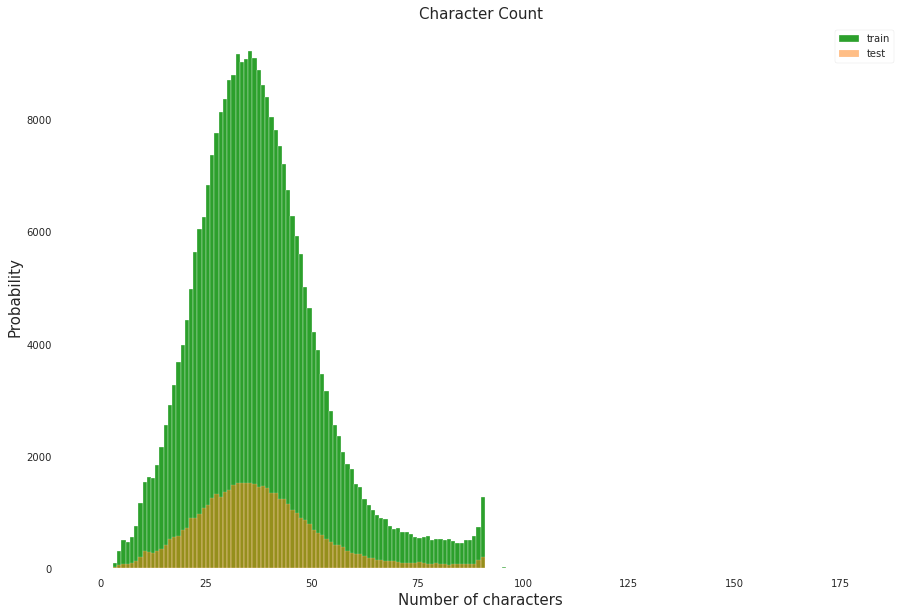

In [16]:
pal = sns.color_palette()
train = df['raw_address'].apply(len)
valid = validation['raw_address'].apply(len)

plt.figure(figsize=(15, 10))
plt.hist(train, bins=180, range=[0, 180], color=pal[2], label='train')
plt.hist(valid, bins=180, range=[0, 180], color=pal[1], alpha=0.5, label='test')
plt.title('Character Count', fontsize=15)
plt.legend()
plt.xlabel('Number of characters', fontsize=15)
plt.ylabel('Probability', fontsize=15);

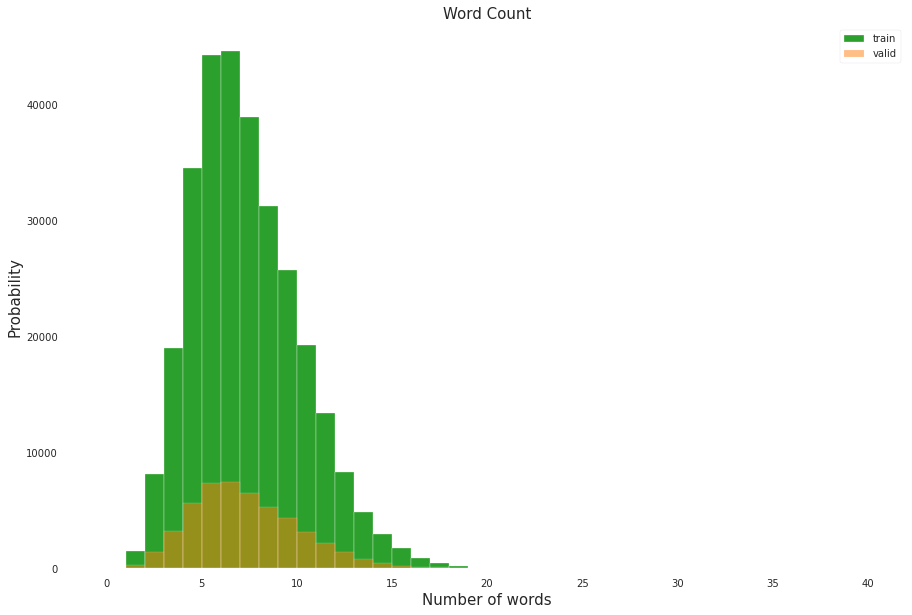

In [17]:
train = df['raw_address'].apply(lambda x: len(x.split(' ')))
valid = validation['raw_address'].apply(lambda x: len(x.split(' ')))

plt.figure(figsize=(15, 10))
plt.hist(train, bins=40, range=[0, 40], color=pal[2], label='train')
plt.hist(valid, bins=40, range=[0, 40], color=pal[1], alpha=0.5, label='valid')
plt.title('Word Count', fontsize=15)
plt.legend()
plt.xlabel('Number of words', fontsize=15)
plt.ylabel('Probability', fontsize=15);

[Table of Contents](#top)
<a id="5"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>5. Top Unigram Distribution<center><h2>

In [18]:
def get_top_n_words(corpus, n=None):
    """
    List the top n words in a vocabulary according to occurrence in a text corpus.
    """
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [19]:
unigrams = get_top_n_words(df['raw_address'], 20)
df1 = pd.DataFrame(unigrams, columns = ['Text', 'count'])

df1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', yTitle='Count', linecolor='black',color='red', title='Top 20 Unigrams',orientation='h')

[Table of Contents](#top)
<a id="6"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>6. Top Bigram Distribution<center><h2>

In [20]:
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [21]:
bigrams = get_top_n_gram(df['raw_address'],(2,2),20)
df1 = pd.DataFrame(bigrams, columns = ['Text', 'count'])

df1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', yTitle='Count', linecolor='black',color='red', title='Top 20 Bigrams',orientation='h')

[Table of Contents](#top)
<a id="7"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>7. Top Trigram Distribution<center><h2>

In [22]:
trigrams = get_top_n_gram(df['raw_address'],(3,3),20)
df1 = pd.DataFrame(trigrams, columns = ['Text' , 'count'])

df1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', yTitle='Count', linecolor='black',color='red', title='Top 20 Trigrams',orientation='h')

[Table of Contents](#top)
<a id="8"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>8. Most Common Words<center><h2>

In [23]:
def get_top_n_words(corpus, n=None):
    """
    List the top n words in a vocabulary according to occurrence in a text corpus.
    """
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [24]:
top_words = get_top_n_words(df['raw_address'])
x = [x[0] for x in top_words[:30]]
y = [x[1] for x in top_words[:30]]

In [25]:
fig = go.Figure([go.Bar(x=x, y=y, text=y)])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', title_text='Most Common Words')

[Table of Contents](#top)
<a id="9"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>9. Word Cloud<center><h2>

In [26]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(10, 8)) # Set figure size
    plt.imshow(wordcloud) # Display image
    plt.axis("off"); # No axis details

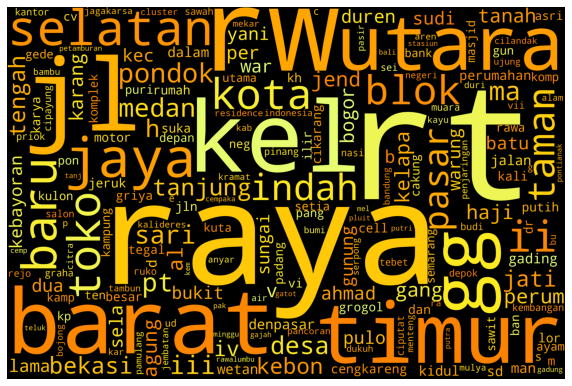

In [27]:
wordcloud = WordCloud(width = 3000, 
                      height = 2000,
                      random_state=1, 
                      background_color='black', 
                      colormap='Wistia', 
                      collocations=False).generate(" ".join(df['raw_address']))

plot_cloud(wordcloud)

[Table of Contents](#top)
<a id="10"></a>
<h2 style='background:#FFA500; border:0; color:white'><center>References<center><h2>

If there are any suggestions/changes you would like to see in this notebook, please let me know. Appreciate every ounce of help!

* https://www.kaggle.com/parulpandey/eda-and-preprocessing-for-bert
* https://www.kaggle.com/thiagopanini/e-commerce-sentiment-analysis-eda-viz-nlp
* https://www.kaggle.com/anokas/data-analysis-xgboost-starter-0-35460-lb
* https://www.quora.com/How-do-you-enter-Indonesian-shipping-addresses-for-USPS-when-they-are-too-long
* https://www.kaggle.com/raenish/cheatsheet-text-helper-functions
* https://towardsdatascience.com/simple-wordcloud-in-python-2ae54a9f58e5